# Selecting or masking a spatial area from a gridded dataset

The select_spatial function is used to select or mask a spatial area from a gridded dataset based on some bounding geometry (e.g. a polygon from a shapefile). 

The bounding geometry provided does not need to be in the same coordinate reference system as the gridded dataset; this function will handle necessary conversions. 

This function is a thin wrapper around [rioxarray's clip function](https://corteva.github.io/rioxarray/latest/examples/clip_geom.html), and kwargs for that function can be passed through. 

In [1]:
import geopandas as gpd 
import ecodata as eco 
import xarray as xr
import hvplot.xarray  # noqa
import hvplot.pandas
import spatialpandas as spd
from pyproj.crs import CRS

## Example: Selecting MODIS data within the Y2Y boundary 

In [2]:
# Y2Y region boundary 
y2yfile = eco.get_path('y2y_region_priority_areas_2013.gdb')
y2y = gpd.read_file(y2yfile)

Note that this shapefile is not in the same coordinate reference system as the gridded data products. The ``select_spatial`` function will handle the conversion to a consistent coordinate system. 

In [3]:
y2y.crs

<Derived Projected CRS: PROJCS["WGS_1984_Albers",GEOGCS["WGS 84",DATUM["WG ...>
Name: WGS_1984_Albers
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Albers Equal Area
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [4]:
# MODIS NDVI data 
filein = eco.get_path("MOD13A1.006_500m_aid0001_all.nc")
ds = xr.load_dataset(filein)
ds

<xarray.Dataset>
Dimensions:                   (time: 208, lat: 1137, lon: 992)
Coordinates:
  * time                      (time) object 2000-02-18 00:00:00 ... 2009-02-1...
  * lat                       (lat) float64 57.34 57.34 57.33 ... 52.61 52.61
  * lon                       (lon) float64 -123.9 -123.9 ... -119.8 -119.8
Data variables:
    crs                       int8 -127
    _500m_16_days_NDVI        (time, lat, lon) float32 0.3663 0.3146 ... -0.0013
    _500m_16_days_VI_Quality  (time, lat, lon) float64 2.076e+04 ... 1.845e+04
Attributes:
    title:        MOD13A1.006 for aid0001
    Conventions:  CF-1.6
    institution:  Land Processes Distributed Active Archive Center (LP DAAC)
    source:       AppEEARS v3.4
    references:   See README.md
    history:      See README.md

In [5]:
# Select MODIS data that falls within the y2y boundary 
ds_subset = eco.select_spatial(ds, boundary=y2y)
ds_subset

<xarray.Dataset>
Dimensions:                   (time: 208, lat: 1137, lon: 992)
Coordinates:
  * time                      (time) object 2000-02-18 00:00:00 ... 2009-02-1...
  * lat                       (lat) float64 57.34 57.34 57.33 ... 52.61 52.61
  * lon                       (lon) float64 -123.9 -123.9 ... -119.8 -119.8
    crs                       int64 0
Data variables:
    _500m_16_days_NDVI        (time, lat, lon) float32 0.3663 0.3146 ... -0.0013
    _500m_16_days_VI_Quality  (time, lat, lon) float64 2.076e+04 ... 1.845e+04
Attributes:
    title:        MOD13A1.006 for aid0001
    Conventions:  CF-1.6
    institution:  Land Processes Distributed Active Archive Center (LP DAAC)
    source:       AppEEARS v3.4
    references:   See README.md
    history:      See README.md

In [6]:
# Plot the results with the y2y boundary
y2y_proj = spd.GeoDataFrame(y2y.to_crs(CRS.from_user_input(ds_subset.rio.crs)))
y2y_proj.hvplot(alpha=0.2) * ds_subset.hvplot(x='lon', y='lat', z = '_500m_16_days_NDVI', groupby='time', cmap='Greens') 

:DynamicMap   [time]
   :Overlay
      .Polygons.I :Polygons   [x,y]
      .Image.I    :Image   [lon,lat]   (_500m_16_days_NDVI)

In [7]:
# Plot just the spatial subset
ds_subset.hvplot(x='lon', y='lat', z = '_500m_16_days_NDVI', groupby='time', cmap='Greens')

:DynamicMap   [time]
   :Image   [lon,lat]   (_500m_16_days_NDVI)

## Example: Selecting ECMWF data within the Y2Y boundary

This example uses temperature data from ECMWF

In [8]:
#ECMWF dataset 
filein = eco.get_path("ECMWF_short.nc")
ds = xr.load_dataset(filein)

In [9]:
# Plot the original dataset
ds.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm')

:DynamicMap   [time]
   :Image   [longitude,latitude]   (t2m)

In [10]:
# Select data within the Y2Y boundary 
ds_subset = eco.select_spatial(ds, boundary=y2y)

In [11]:
# Plot the results 
y2y_proj = spd.GeoDataFrame(y2y.to_crs(CRS.from_user_input(ds_subset.rio.crs)))
y2y_proj.hvplot(alpha=0.2) * ds_subset.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm') 

:DynamicMap   [time]
   :Overlay
      .Polygons.I :Polygons   [x,y]
      .Image.I    :Image   [longitude,latitude]   (t2m)

## Example: Multiple polygons 

The ``select_spatial`` function will handle cases where the bounding geometry contains multiple polygons. 

In [12]:
#ECMWF dataset 
filein = eco.get_path("ECMWF_subset.nc")
ds = xr.load_dataset(filein)

In [13]:
# Plot the original dataset
ds.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm')

:DynamicMap   [time]
   :Image   [longitude,latitude]   (t2m)

In [14]:
# Example shapefile with multiple polygons 
filein = eco.get_path('combined_poly_overlapping.shp')
shp = gpd.read_file(filein)

Here, we use a simple example shapefile that contains two polygons: 

<AxesSubplot: >

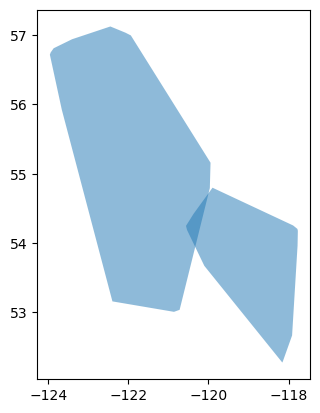

In [15]:
shp.plot(alpha=0.5)

In [16]:
# Select data that falls within the bounding polygons 
ds_subset = eco.select_spatial(ds, boundary=shp)
ds_subset

<xarray.Dataset>
Dimensions:      (longitude: 24, latitude: 19, time: 720)
Coordinates:
  * longitude    (longitude) float32 -123.8 -123.5 -123.2 ... -118.2 -118.0
  * latitude     (latitude) float32 57.0 56.75 56.5 56.25 ... 53.0 52.75 52.5
  * time         (time) datetime64[ns] 2008-06-01 ... 2008-06-30T23:00:00
    spatial_ref  int64 0
Data variables:
    u10          (time, latitude, longitude) float32 nan nan nan ... 1.055 nan
    v10          (time, latitude, longitude) float32 nan nan nan ... 0.2269 nan
    t2m          (time, latitude, longitude) float32 nan nan nan ... 296.2 nan
Attributes:
    Conventions:  CF-1.6
    history:      2022-06-14 00:45:00 GMT by grib_to_netcdf-2.24.3: /opt/ecmw...

In [17]:
# Plot the selected subset
shp_proj = spd.GeoDataFrame(shp.to_crs(CRS.from_user_input(ds_subset.rio.crs)))
ds_subset.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm') * shp_proj.hvplot(fill_color=None)

:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]

## Masking a gridded dataset 

The selection operation can be inverted (i.e., to do masking rather than selection). In this case, data contained within the bounding geometry will be removed, and data outside the bounding geometry will be selected. Simply pass ``invert=True`` to the ``select_spatial`` function: 

In [18]:
ds_subset = eco.select_spatial(ds, boundary=shp, invert=True)
ds_subset.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm') * shp_proj.hvplot(fill_color=None)

:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]

## Additional options 
Additional arguments supported by [rioxarray's clip function](https://corteva.github.io/rioxarray/latest/rioxarray.html#rioxarray.raster_array.RasterArray.clip) can also be used. As an example, we can modify the way the edge pixels are handled. By default, only pixels whose center is within the bounding geometry are selected, but we can change this so that all pixels that are touched by the bounding geometry will be selected: 

In [19]:
ds_subset1 = eco.select_spatial(ds, boundary=shp)  # Default behavior
ds_subset2 = eco.select_spatial(ds, boundary=shp, all_touched=True)  # Keep all pixels touched by the bounding geometry

In [20]:
ds_subset1.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm', title='Default edge behavior')* shp_proj.hvplot(fill_color=None) 


:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]

In [21]:
ds_subset2.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm', title='all_touched=True') * shp_proj.hvplot(fill_color=None)

:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]

In [22]:
# Example for masking 
ds_subset1 = eco.select_spatial(ds, boundary=shp, invert=True)  # Default behavior
ds_subset2 = eco.select_spatial(ds, boundary=shp, invert=True, all_touched=True)  # Keep all pixels touched by the bounding geometry

In [23]:
ds_subset1.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm', title='Default edge behavior')* shp_proj.hvplot(fill_color=None) 

:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]

In [24]:
ds_subset2.hvplot(x='longitude', y='latitude', z = 't2m', groupby='time', cmap='coolwarm', title='all_touched=True')* shp_proj.hvplot(fill_color=None) 

:DynamicMap   [time]
   :Overlay
      .Image.I    :Image   [longitude,latitude]   (t2m)
      .Polygons.I :Polygons   [x,y]